In [ ]:
import os
import pathlib
import random
import numpy as np
import matplotlib.pyplot as plt

import zipfile
import requests
import glob as glob

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, Conv2D, MaxPooling2D, Dropout, Flatten
from tensorflow.keras.utils import image_dataset_from_directory

from matplotlib.ticker import (MultipleLocator, FormatStrFormatter)
from dataclasses import dataclass

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#code to check image file supported by tensorflow
from pathlib import Path
import imghdr

data_dir = "/content/drive/MyDrive/disease /valid/2"
image_extensions = [".png", ".jpg"]  # add there all your images file extensions

img_type_accepted_by_tf = ["bmp", "gif", "jpeg", "png"]
for filepath in Path(data_dir).rglob("*"):
    if filepath.suffix.lower() in image_extensions:
        img_type = imghdr.what(filepath)
        if img_type is None:
            print(f"{filepath} is not an image")
        elif img_type not in img_type_accepted_by_tf:
            print(f"{filepath} is a {img_type}, not accepted by TensorFlow")

In [ ]:
#code to check count of image file extension
import pandas as pd
from collections import Counter

# Load the CSV file into a DataFrame
csv_file = '/content/test (1).csv'  # Replace with the path to your CSV file
df = pd.read_csv(csv_file)

# Extract the file paths from the "Image_Path" column
file_paths = df['image_relpath']

# Initialize a Counter to count the extensions
extension_counter = Counter()

# Count the occurrences of each extension
for file_path in file_paths:
    extension = file_path.split('.')[-1]
    extension_counter[extension] += 1

# Print the count of each extension
for extension, count in extension_counter.items():
    print(f"Extension: {extension}, Count: {count}")


Extension: png, Count: 291
Extension: jpg, Count: 180


In [ ]:
#code to store sorted csv file
import pandas as pd

# Load the CSV file into a DataFrame
csv_file = '/content/test (1).csv'  # Replace with the path to your CSV file
df = pd.read_csv(csv_file)

# Sort the DataFrame based on the "Image_Path" column
df_sorted = df.sort_values(by="image_relpath")

# Save the sorted DataFrame back to a CSV file
sorted_csv_file = 'sorted_data.csv'  # Replace with the desired output file name
df_sorted.to_csv(sorted_csv_file, index=False)

print(f'CSV file "{sorted_csv_file}" has been sorted and saved.')


CSV file "sorted_data.csv" has been sorted and saved.


In [ ]:

@dataclass(frozen=True)
class DatasetConfig:
    NUM_CLASSES: int = 3
    IMG_HEIGHT:  int = 224
    IMG_WIDTH:   int = 224
    CHANNELS:    int = 3

    DATA_ROOT_TRAIN:  str = "/content/drive/MyDrive/disease /train"
    DATA_ROOT_VALID:  str = '/content/drive/MyDrive/disease /valid'
    DATA_ROOT_TEST:   str = '/content/drive/MyDrive/disease /test'
    DATA_ROOT_TESTING: str = '/content/drive/MyDrive/disease /testing'
    DATA_TEST_GT:     str = "/content/sorted_data.csv"

@dataclass(frozen=True)
class TrainingConfig:
    BATCH_SIZE:       int   = 32
    EPOCHS:           int   = 101
    LEARNING_RATE:    float = 0.0001
    DROPOUT:          float = 0.6
    LAYERS_FINE_TUNE: int   = 8

In [ ]:
train_dataset = image_dataset_from_directory(directory=DatasetConfig.DATA_ROOT_TRAIN,
                                             batch_size=TrainingConfig.BATCH_SIZE,
                                             shuffle=True,
                                             seed=42,
                                             label_mode='int',        # Use integer encoding
                                             image_size=(DatasetConfig.IMG_HEIGHT, DatasetConfig.IMG_WIDTH),
                                            )

valid_dataset = image_dataset_from_directory(directory=DatasetConfig.DATA_ROOT_VALID,
                                             batch_size=TrainingConfig.BATCH_SIZE,
                                             shuffle=True,
                                             seed=42,
                                             label_mode='int',        # Use integer encoding
                                             image_size=(DatasetConfig.IMG_HEIGHT, DatasetConfig.IMG_WIDTH),
                                            )

Found 2292 files belonging to 3 classes.
Found 466 files belonging to 3 classes.


In [ ]:
class_names_int = list(map(int, train_dataset.class_names))

# Create a dictionary mapping ground truth IDs to class name IDs.
gtid_2_cnidx = dict(zip(class_names_int, range(0,DatasetConfig.NUM_CLASSES)))

gtid_2_cnidx.items()


dict_items([(0, 0), (1, 1), (2, 2)])

In [ ]:
class_names = train_dataset.class_names

['0', '1', '2']
Error in callback <function _draw_all_if_interactive at 0x7cd15a9edea0> (for post_execute):


KeyboardInterrupt: ignored

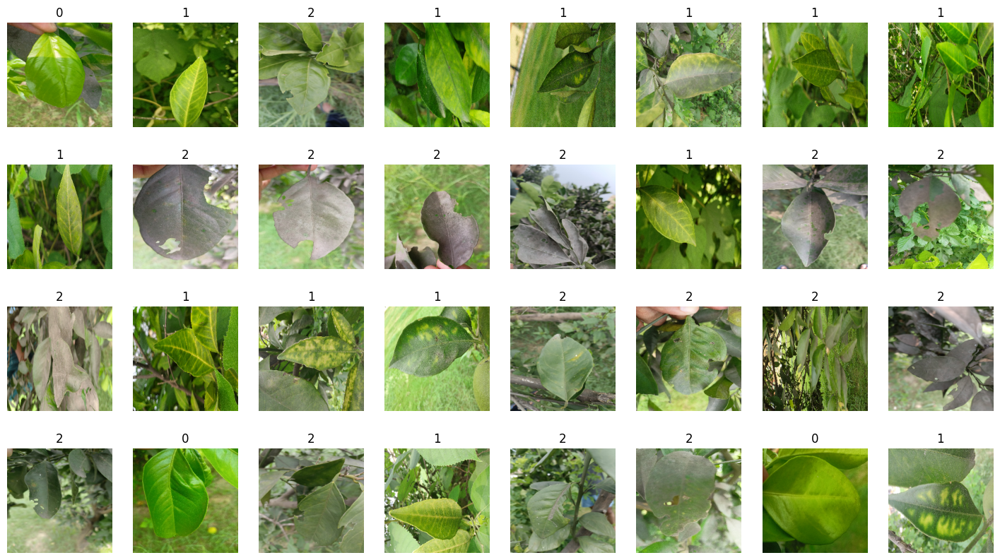

In [ ]:
print(class_names)

plt.figure(figsize=(18,10))

# Assumes dataset batch_size is at least 32.
num_rows = 4
num_cols = 8

# Here we use the take() method to retrieve just the first batch of data from the training portion of the dataset.
for image_batch, labels_batch in train_dataset.take(1):

    # Plot each of the images in the batch and the associated ground truth labels.
    for i in range(num_rows*num_cols):
        ax = plt.subplot(num_rows, num_cols, i + 1)
        plt.imshow(image_batch[i].numpy().astype("uint8"))
        truth_idx = labels_batch[i].numpy()
        plt.title(class_names[truth_idx])
        plt.axis("off")

In [ ]:
import pandas as pd

input_file = DatasetConfig.DATA_TEST_GT

dataset = pd.read_csv(input_file)
df = pd.DataFrame(dataset)
cols = [1]
df = df[df.columns[cols]]
ground_truth_ids = df['target'].values.tolist()
print("Total number of Test labels: ", len(ground_truth_ids))
print(len(ground_truth_ids))
print(ground_truth_ids[50:60])

Total number of Test labels:  471
471
[2, 2, 2, 2, 2, 2, 2, 2, 2, 2]


In [ ]:
label_ids = []
for idx in range(len(ground_truth_ids)):
    label_ids.append(gtid_2_cnidx[ground_truth_ids[idx]])

print('Original ground truth class IDs: ',ground_truth_ids[0:10])
print('New mapping required:            ',label_ids[0:10])

print('')
print('Train/Valid dataset class names: ',train_dataset.class_names)
print(len(label_ids))
print(label_ids)

Original ground truth class IDs:  [2, 2, 2, 2, 2, 2, 2, 2, 2, 2]
New mapping required:             [2, 2, 2, 2, 2, 2, 2, 2, 2, 2]

Train/Valid dataset class names:  ['0', '1', '2']
471
[2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1

In [ ]:
image_paths = sorted(glob.glob(DatasetConfig.DATA_ROOT_TEST + '/*.[pj][np][ge]*'))


print(len(image_paths))
print('')
print(image_paths)
# Print the first 5 image paths to confirm.
for idx in range(20):
    print(image_paths[idx])

471

['/content/drive/MyDrive/disease /test/IMG20220910102620.jpg', '/content/drive/MyDrive/disease /test/IMG20220910103037 (1).jpg', '/content/drive/MyDrive/disease /test/IMG20220910103635.jpg', '/content/drive/MyDrive/disease /test/IMG20220910103908.jpg', '/content/drive/MyDrive/disease /test/IMG20220910104743.jpg', '/content/drive/MyDrive/disease /test/IMG20220910114637_BURST001_COVER.jpg', '/content/drive/MyDrive/disease /test/IMG20220910114637_BURST003.jpg', '/content/drive/MyDrive/disease /test/IMG20220910114832_BURST003.jpg', '/content/drive/MyDrive/disease /test/IMG20220910114901_BURST004.jpg', '/content/drive/MyDrive/disease /test/IMG20220910114901_BURST007.jpg', '/content/drive/MyDrive/disease /test/IMG20220910114914_BURST004.jpg', '/content/drive/MyDrive/disease /test/IMG20220910114914_BURST006.jpg', '/content/drive/MyDrive/disease /test/IMG20220910114914_BURST007.jpg', '/content/drive/MyDrive/disease /test/IMG20220910114946_BURST002.jpg', '/content/drive/MyDrive/disease /te

In [ ]:

test_dataset = tf.data.Dataset.from_tensor_slices((image_paths, label_ids))

In [ ]:
def preprocess_image(image):
    # Decode and resize image.
    image = tf.image.decode_png(image, channels=3)
    image = tf.image.resize(image, [DatasetConfig.IMG_WIDTH, DatasetConfig.IMG_HEIGHT])
    return image

In [ ]:
def load_and_preprocess_image(path):
    # Read image into memory as a byte string.
    image = tf.io.read_file(path)
    return preprocess_image(image)

In [ ]:
def load_and_preprocess_from_path_label(path, label):
    return load_and_preprocess_image(path), label

In [ ]:
test_dataset = test_dataset.map(load_and_preprocess_from_path_label)

# Set the batch size for the dataset.
test_dataset = test_dataset.batch(TrainingConfig.BATCH_SIZE)

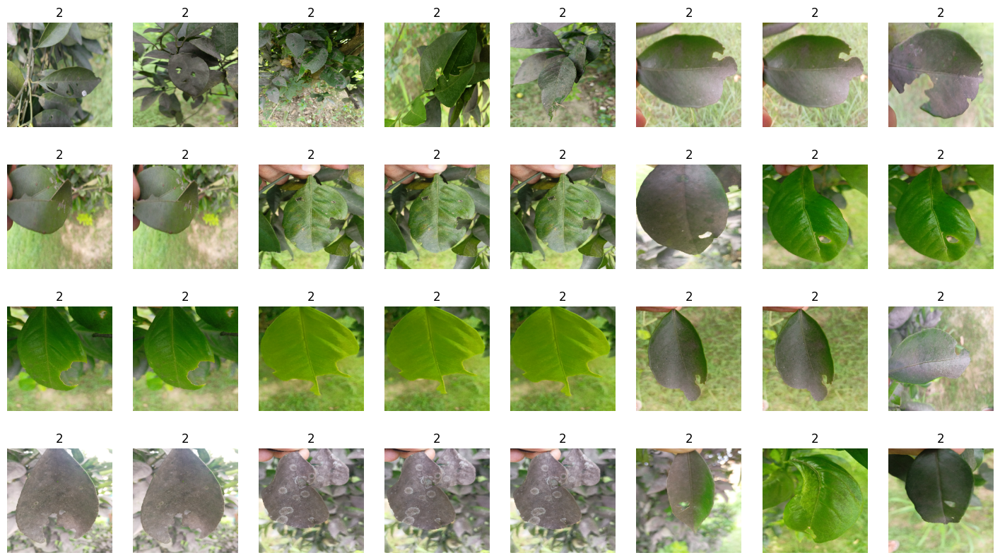

In [ ]:
plt.figure(figsize=(18,10))

# Assumes dataset batch_size is at least 32.
num_rows = 4
num_cols = 8

# Here we use the take() method to retrieve just the first batch of data from the test dataset.
for image_batch, labels_batch in test_dataset.take(1):

    # Plot each of the images in the batch and the associated ground truth labels.
    for i in range(num_rows*num_cols):
        ax = plt.subplot(num_rows, num_cols, i + 1)
        plt.imshow(image_batch[i].numpy().astype("uint8"))
        truth_idx = labels_batch[i].numpy()
        plt.title(class_names[truth_idx])
        plt.axis("off")

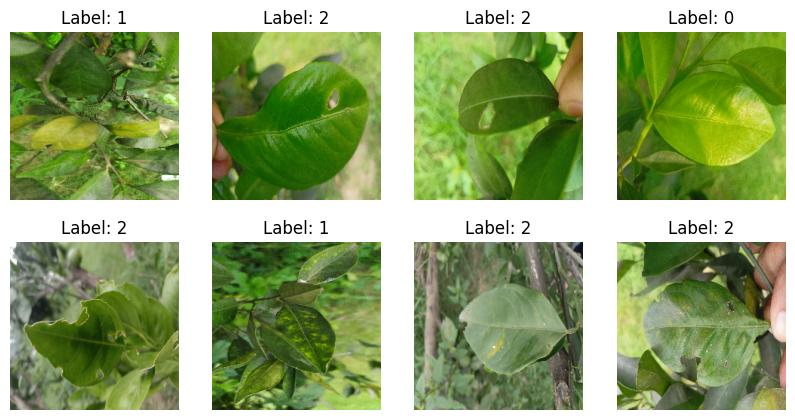

In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt



def preprocess_image(image, label):

    image = tf.image.random_flip_left_right(image)
    image = tf.image.random_flip_up_down(image)
    image = tf.image.rot90(image, k=1)



    return image, label




train_dataset = train_dataset.map(preprocess_image)
valid_dataset= valid_dataset.map(preprocess_image)
test_dataset= test_dataset.map(preprocess_image)

for images, labels in train_dataset.take(1):
    plt.figure(figsize=(10, 5))
    for i in range(8):
        plt.subplot(2, 4, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(f"Label: {labels[i].numpy()}")
        plt.axis("off")

    plt.show()


In [ ]:
input_shape = (DatasetConfig.IMG_HEIGHT, DatasetConfig.IMG_WIDTH, DatasetConfig.CHANNELS)

print('Loading model with ImageNet weights...')
resnet_conv_base = tf.keras.applications.ResNet50V2(input_shape=input_shape,
                                                    include_top=False, # We will supply our own top.
                                                    weights='imagenet',
                                                   )
print(resnet_conv_base.summary())

Loading model with ImageNet weights...
94668760/94668760 [==============================] - 1s 0us/step
Model: "resnet50v2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 pool1_pad (ZeroPadding2D)   (None, 114, 114, 64)         0         ['conv1_conv[0][

In [ ]:
resnet_conv_base.trainable = True


num_layers = len(resnet_conv_base.layers)
print(num_layers)

190


In [ ]:
inputs = tf.keras.Input(shape=input_shape)

x = tf.keras.applications.resnet.preprocess_input(inputs)

x = resnet_conv_base(x)

x = layers.Flatten()(x)
x = layers.Dense(128, activation='relu')(x)
x = layers.Dropout(TrainingConfig.DROPOUT)(x)

# The final `Dense` layer with the number of classes.
outputs = layers.Dense(DatasetConfig.NUM_CLASSES, activation='softmax')(x)

# The final model.
model_vgg16_finetune = keras.Model(inputs, outputs)

print(model_vgg16_finetune.summary())

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 tf.__operators__.getitem (  (None, 224, 224, 3)       0         
 SlicingOpLambda)                                                
                                                                 
 tf.nn.bias_add (TFOpLambda  (None, 224, 224, 3)       0         
 )                                                               
                                                                 
 resnet50v2 (Functional)     (None, 7, 7, 2048)        23564800  
                                                                 
 flatten (Flatten)           (None, 100352)            0         
                                                                 
 dense (Dense)               (None, 128)               128451

In [ ]:
model_vgg16_finetune.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=TrainingConfig.LEARNING_RATE),
                    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
                    metrics=['accuracy'],
                   )

In [ ]:
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=7)

In [ ]:
training_results = model_vgg16_finetune.fit(train_dataset,
                                            epochs=TrainingConfig.EPOCHS,
                                            validation_data=valid_dataset,
                                            callbacks=[callback],
                                           )

Epoch 1/101
72/72 [==============================] - 474s 6s/step - loss: 0.6529 - accuracy: 0.8002 - val_loss: 1.0616 - val_accuracy: 0.7275
Epoch 2/101
72/72 [==============================] - 176s 2s/step - loss: 0.1035 - accuracy: 0.9642 - val_loss: 0.2090 - val_accuracy: 0.9421
Epoch 3/101
72/72 [==============================] - 161s 2s/step - loss: 0.0691 - accuracy: 0.9777 - val_loss: 0.0314 - val_accuracy: 0.9893
Epoch 4/101
72/72 [==============================] - 163s 2s/step - loss: 0.0494 - accuracy: 0.9860 - val_loss: 0.0388 - val_accuracy: 0.9893
Epoch 5/101
72/72 [==============================] - 158s 2s/step - loss: 0.0424 - accuracy: 0.9873 - val_loss: 0.0365 - val_accuracy: 0.9893
Epoch 6/101
72/72 [==============================] - 162s 2s/step - loss: 0.0250 - accuracy: 0.9935 - val_loss: 0.0563 - val_accuracy: 0.9850
Epoch 7/101
72/72 [==============================] - 177s 2s/step - loss: 0.0206 - accuracy: 0.9935 - val_loss: 0.0211 - val_accuracy: 0.9957
Epoch 

In [ ]:
def plot_results(metrics, ylabel=None, ylim=None, metric_name=None, color=None):

    fig, ax = plt.subplots(figsize=(15, 4))

    if not (isinstance(metric_name, list) or isinstance(metric_name, tuple)):
        metrics = [metrics,]
        metric_name = [metric_name,]

    for idx, metric in enumerate(metrics):
        ax.plot(metric, color=color[idx])

    plt.xlabel("Epoch")
    plt.ylabel(ylabel)
    plt.title(ylabel)
    plt.xlim([0, TrainingConfig.EPOCHS-1])
    plt.ylim(ylim)
    # Tailor x-axis tick marks
    ax.xaxis.set_major_locator(MultipleLocator(5))
    ax.xaxis.set_major_formatter(FormatStrFormatter('%d'))
    ax.xaxis.set_minor_locator(MultipleLocator(1))
    plt.grid(True)
    plt.legend(metric_name)
    plt.show()
    plt.close()

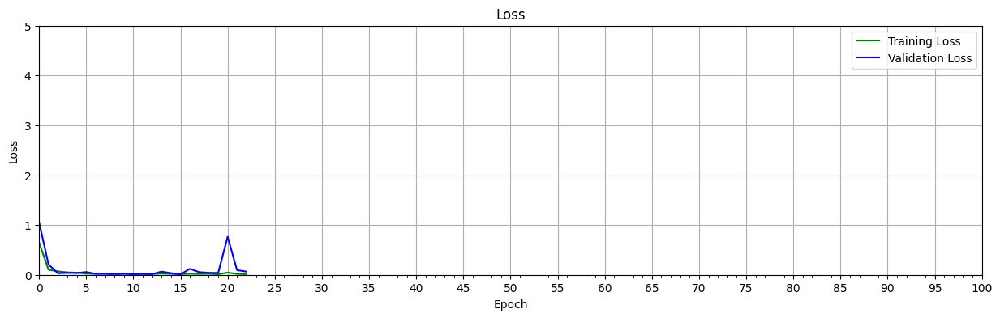

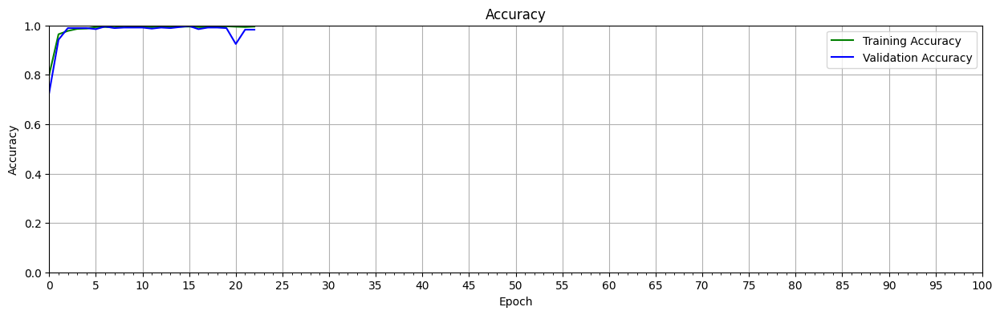

In [ ]:
train_loss = training_results.history["loss"]
train_acc  = training_results.history["accuracy"]
valid_loss = training_results.history["val_loss"]
valid_acc  = training_results.history["val_accuracy"]

plot_results([ train_loss, valid_loss ],
            ylabel="Loss",
            ylim = [0.0, 5.0],
            metric_name=["Training Loss", "Validation Loss"],
            color=["g", "b"]);

plot_results([ train_acc, valid_acc ],
            ylabel="Accuracy",
            ylim = [0.0, 1.0],
            metric_name=["Training Accuracy", "Validation Accuracy"],
            color=["g", "b"])

In [ ]:
def display_predictions(dataset, model, class_names):

    plt.figure(figsize=(20,20))
    num_rows = 8
    num_cols = 8
    jdx = 0

    # Evaluate all the batches.
    for image_batch, labels_batch in dataset.take(2):

        print(image_batch.shape)

        # Predictions for the current batch.
        predictions = model.predict(image_batch)

        # Loop over all the images in the current batch.
        for idx in range(len(labels_batch)):

            pred_idx = tf.argmax(predictions[idx]).numpy()
            truth_idx = labels_batch[idx].numpy()

            # Set the title color based on the prediction.
            if pred_idx == truth_idx:
                color='g'
            else:
                color='r'

            jdx += 1

            if jdx > num_rows*num_cols:
                # Break from the loops if the maximum number of images have been plotted
                break

            ax = plt.subplot(num_rows, num_cols, jdx)
            title = str(class_names[truth_idx]) + " : " + str(class_names[pred_idx])

            title_obj = plt.title(title)
            plt.setp(title_obj, color=color)
            plt.axis("off")
            plt.imshow(image_batch[idx].numpy().astype("uint8"));
    return

(32, 224, 224, 3)
1/1 [==============================] - 2s 2s/step
(32, 224, 224, 3)
1/1 [==============================] - 0s 157ms/step


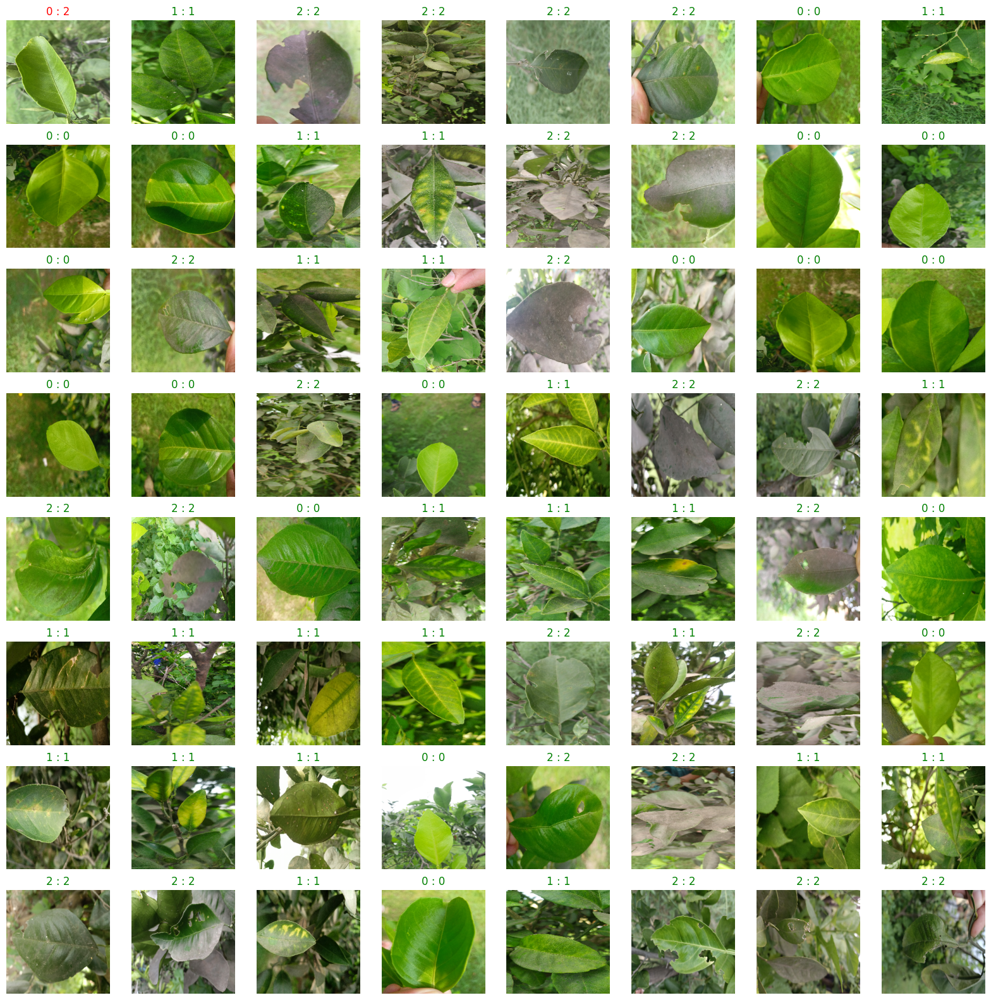

In [ ]:
display_predictions(valid_dataset, model_vgg16_finetune, class_names)

(32, 224, 224, 3)
1/1 [==============================] - 0s 138ms/step
(32, 224, 224, 3)
1/1 [==============================] - 0s 50ms/step


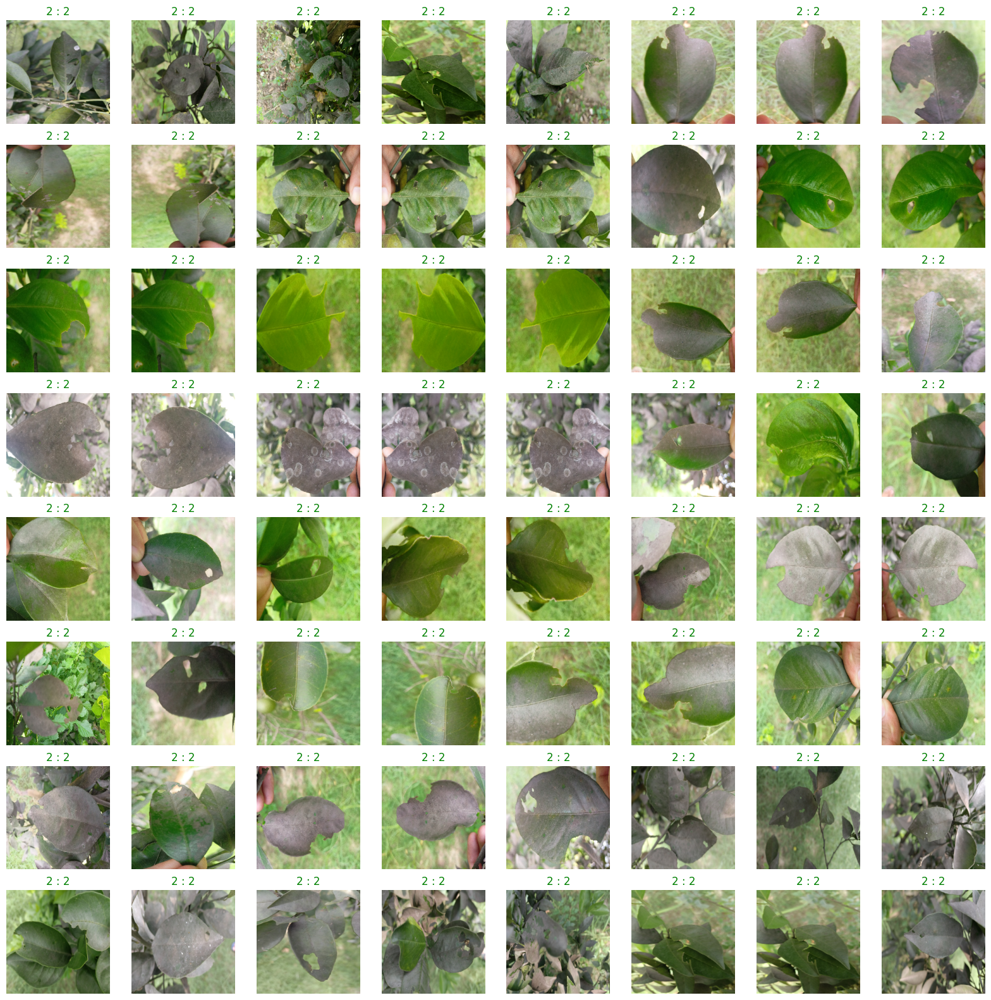

In [ ]:
display_predictions(test_dataset, model_vgg16_finetune, class_names)

In [ ]:
print(f"Model valid accuracy: {model_vgg16_finetune.evaluate(valid_dataset)[1]*100.:.3f}")


15/15 [==============================] - 27s 793ms/step - loss: 0.0620 - accuracy: 0.9893
Model valid accuracy: 98.927


In [ ]:
print(f"Model test accuracy: {model_vgg16_finetune.evaluate(test_dataset)[1]*100.:.3f}")


15/15 [==============================] - 45s 2s/step - loss: 0.1205 - accuracy: 0.9830
Model test accuracy: 98.301


In [ ]:
model_vgg16_finetune.save("my_model_augmented")

In [ ]:
import tensorflow as tf

# Load the model from the SavedModel directory
loaded_model = tf.keras.models.load_model('/content/drive/MyDrive/my_model')


In [ ]:
testing_dataset = image_dataset_from_directory(directory=DatasetConfig.DATA_ROOT_TESTING  ,
                                             batch_size=TrainingConfig.BATCH_SIZE,
                                             shuffle=True,
                                             seed=42,
                                             label_mode='int',        # Use integer encoding
                                             image_size=(DatasetConfig.IMG_HEIGHT, DatasetConfig.IMG_WIDTH),
                                            )

Found 9 files belonging to 3 classes.


In [ ]:
class_names = testing_dataset.class_names

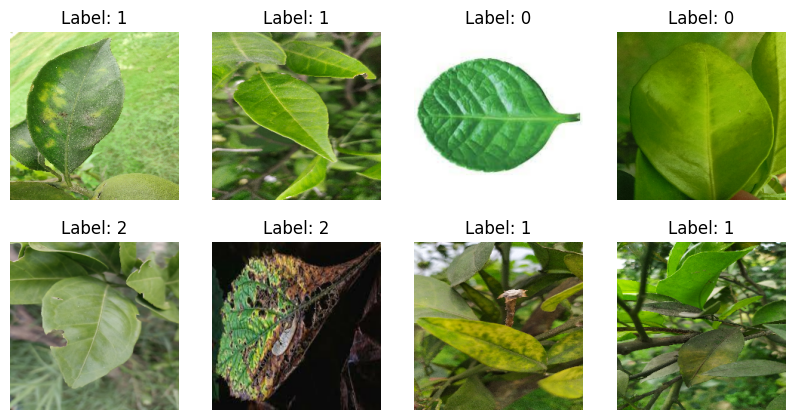

In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt

class_names = testing_dataset.class_names

def preprocess_image(image, label):

    image = tf.image.random_flip_left_right(image)
    image = tf.image.random_flip_up_down(image)
    image = tf.image.rot90(image, k=1)



    return image, label




testing_dataset = testing_dataset.map(preprocess_image)


for images, labels in testing_dataset.take(1):
    plt.figure(figsize=(10, 5))
    for i in range(8):
        plt.subplot(2, 4, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(f"Label: {labels[i].numpy()}")
        plt.axis("off")

    plt.show()


In [ ]:
print(testing_dataset.class_names)

['0', '1', '2']


In [ ]:
class_names = testing_dataset.class_names

(9, 224, 224, 3)
1/1 [==============================] - 0s 29ms/step


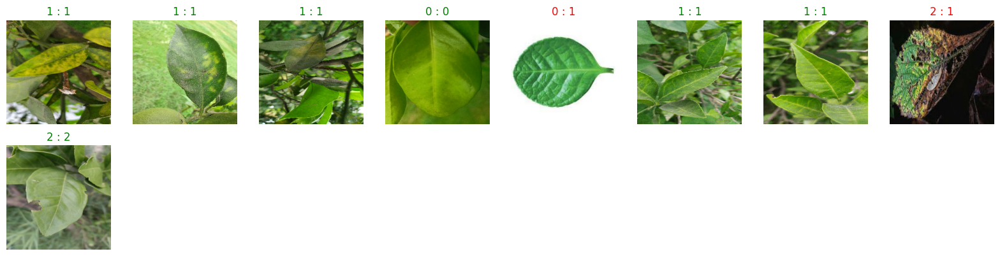

In [ ]:
display_predictions(testing_dataset, model_vgg16_finetune, class_names)